In [1]:
import random 
random.seed(212)
from sklearn.model_selection import train_test_split

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)

In [19]:
from sklearn.metrics import mean_squared_error
# Definition of the root mean squared error
def rmse(y,yprime):
    return np.sqrt(mean_squared_error(y,yprime))

# Definition of the mean absolute percentage error
def mape(y,yprime):
    return (100 * np.sum(np.abs(y-yprime)/y)/len(y))[0]

mape_error_synt = {}
rmse_error_synt = {}

In [3]:
X_train = pd.read_csv('X_train.csv')
X_test = pd.read_csv('X_test.csv')
y_train = pd.read_csv('y_train.csv')
y_test = pd.read_csv('y_test.csv')

In [20]:
# Initialize a scikit-learn model to make a linear regression. 
from sklearn.linear_model import LinearRegression
# Train the model using X_train, y_train 
lr = LinearRegression().fit(X_train, y_train)
# Predict on the X_test dataset
yhat_lr = lr.predict(X_test)

mape_error_synt['Linear regression'] = mape(yhat_lr,y_test)
rmse_error_synt['Linear regression'] = rmse(yhat_lr,y_test)
print("RMSE=", rmse_error_synt['Linear regression'], "MAPE=", mape_error_synt['Linear regression'])

RMSE= 0.923417750049933 MAPE= 97.27864685592337


In [21]:
# Now let's do a multiple regression 

from sklearn import linear_model

reglin_m = linear_model.LinearRegression()
reglin_m.fit(X_train,y_train)
Y_prediction_linm = reglin_m.predict(X_test)
print("Coefficients: ",reglin_m.coef_,"\nIntercept:",reglin_m.intercept_,"\nCoefficent of determination:",reglin_m.score(X_train,y_train))

mape_error_synt['Multiple linear regression'] = mape(Y_prediction_linm,y_test)
rmse_error_synt['Multiple linear regression'] = rmse(Y_prediction_linm,y_test)
print("RMSE={} \nMAPE={}".format(rmse(Y_prediction_linm,y_test),mape(Y_prediction_linm,y_test)))

Coefficients:  [[ 2.11841498e-06 -4.91614139e-02  1.36607506e-02  9.54440839e-01
   4.24547933e-02 -1.23527101e-01  1.59191691e-01 -9.14159675e-01
  -1.82155846e-02  2.44949820e-02  1.58632200e-01 -1.96713088e-01
   1.13715898e-01 -6.08565784e-02 -2.53288147e-02 -1.62595207e-01
   9.90084316e-01  1.70607588e-01  8.18931484e-03 -1.90718364e-02
  -2.36283597e-02  5.08097717e-03  1.73046908e-01]] 
Intercept: [-87.78291737] 
Coefficent of determination: 0.3392072504725131


In [24]:
# Let's try another model: Random Forest using scikit-learn library
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(random_state=1, n_estimators=50).fit(X_train, y_train)
yhat_rf = rf.predict(X_test)
mape_error_synt['Random forest'] = mape(pd.DataFrame(yhat_rf),y_test)
rmse_error_synt['Random forest'] = rmse(pd.DataFrame(yhat_rf),y_test)
print("RMSE={} \nMAPE={}".format(rmse(pd.DataFrame(yhat_rf),y_test),mape(pd.DataFrame(yhat_rf),y_test)))

/var/folders/6f/66wfylh56w70xn5j4ssvqd1c0000gn/T/ipykernel_1802/72623834.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf = RandomForestRegressor(random_state=1, n_estimators=50).fit(X_train, y_train)


In [31]:
#We'll now try with a gradient boosting method
from sklearn import ensemble

gmbreg =ensemble.GradientBoostingRegressor(n_estimators=100,n_iter_no_change=50,validation_fraction=0.30,learning_rate=0.05,random_state=0)
gmbreg.fit(X_train,np.ravel(y_train))
y_prediction9 = gmbreg.predict(X_test)

mape_error_synt['L2 boosting'] = mape(pd.DataFrame(y_prediction9),y_test)
rmse_error_synt['L2 boosting'] = rmse(pd.DataFrame(y_prediction9),y_test)
print("RMSE={} \nMAPE={}".format(rmse(pd.DataFrame(y_prediction9),y_test),mape(pd.DataFrame(y_prediction9),y_test)))

RMSE=0.8187355665099461 
MAPE=0.0


In [32]:
#Now we're going try a Ridge regression

from sklearn.linear_model import RidgeCV,Ridge
# Choose alpha parametre with cross-validation
cross_validation_ridge = RidgeCV(alphas = np.arange(1,4000,1)+0.1)
cross_validation_ridge.fit(X_train,y_train)
best_alpha = cross_validation_ridge.alpha_
ridge_model = Ridge(best_alpha)
ridge_model.fit(X_train,y_train)

Ridge(alpha=10.1)

In [33]:
Y_prediction3 = cross_validation_ridge.predict(X_test) # Prediction avec le meilleur alpha choisi par cross-validation
Y_prediction3Ridge = ridge_model.predict(X_test)
# Les prédiction sont identiques, à l'erreur numérique près
np.linalg.norm(Y_prediction3-Y_prediction3Ridge) 

0.6064694231155034

In [35]:
mape_error_synt['Ridge regression'] = mape(Y_prediction3,y_test)
rmse_error_synt['Ridge regression'] = rmse(Y_prediction3,y_test)
print("RMSE={} \nMAPE={}".format(rmse(Y_prediction3,y_test),mape(Y_prediction3,y_test)))

RMSE=0.9234242009978052 
MAPE=-35.60367019402483


In [37]:
mape_error_synt['Ridge regression best alpha'] = mape(Y_prediction3Ridge,y_test)
rmse_error_synt['Ridge regression best alpha'] = rmse(Y_prediction3Ridge,y_test)
print("RMSE={} \nMAPE={}".format(rmse(Y_prediction3Ridge,y_test),mape(Y_prediction3Ridge,y_test)))

RMSE=0.9234269278104417 
MAPE=65.41962304429342


Text(0, 0.5, 'Root mean square error')

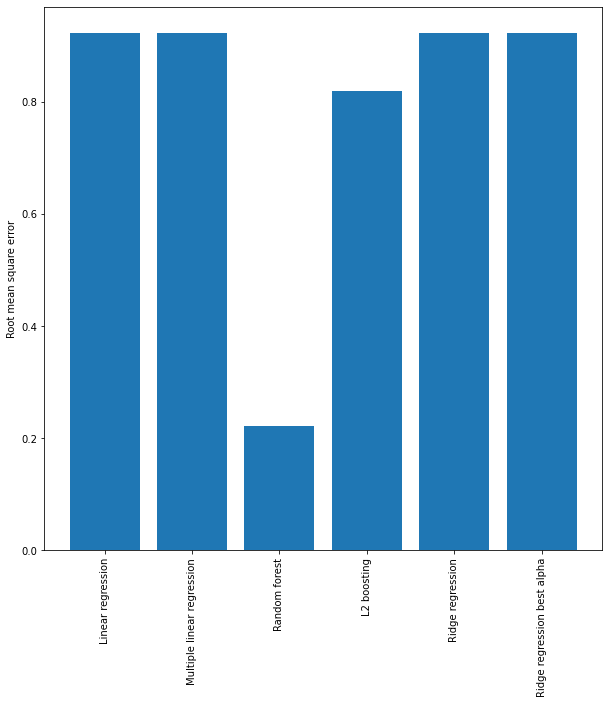

In [38]:
###SYNTHESIS on the diverses methods used to predict the sales
plt.figure(figsize=(10,10))
plt.bar(rmse_error_synt.keys(),rmse_error_synt.values())
plt.xticks(rotation='vertical')
plt.ylabel("Root mean square error")

In [42]:
#let's see how to plot the results to troubleshoot problems!
df_validation = pd.DataFrame(y_test)
df_validation['yhat'] = yhat_rf
df_validation = df_validation.rename(columns={"score": 'y'})

import plotly.express as px
import plotly.graph_objects as go

def plot_truth_vs_actual(validation_df: pd.DataFrame):
    fig = go.Figure(data=go.Scatter(
        x=validation_df.y, y=validation_df.yhat,
        mode="markers",
        name='values',
        marker=dict(color="#00828c", opacity=0.2),
    ))
    fig.add_trace(go.Scatter(x=validation_df.y, y=validation_df.y, name='optimal'))
    fig.update_layout(
        xaxis_title="Truth",
        yaxis_title="Forecast"
    )
    return fig

plot_truth_vs_actual(df_validation)

In [50]:
intercept = rf.feature_importances_
features = pd.DataFrame(rf.feature_importances_, index=X_train.columns ,columns=['coefficient'])
features.head()

,coefficient
FIPS,0.030946
WS10M_MIN,0.003287
QV2M,0.005093
T2M_RANGE,0.006503
WS10M,0.003397


<AxesSubplot:>

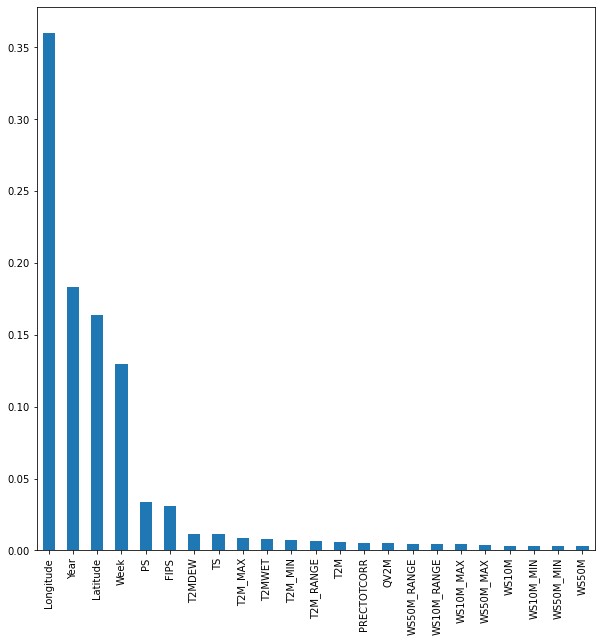

In [51]:
features.coefficient.sort_values(ascending=False).plot(kind='bar', figsize=(10,10))

In [52]:
features.coefficient = features.coefficient.abs()

In [53]:
# We are going to use standard deviation to normalize value, in order to make values comparable.
stdevs = []
for i in X_train.columns:
    stdev = X_train[i].std()
    stdevs.append(stdev)
    
features["stdev"] = np.array(stdevs).reshape(-1,1)
features["importance"] = features["coefficient"] * features["stdev"]

<AxesSubplot:>

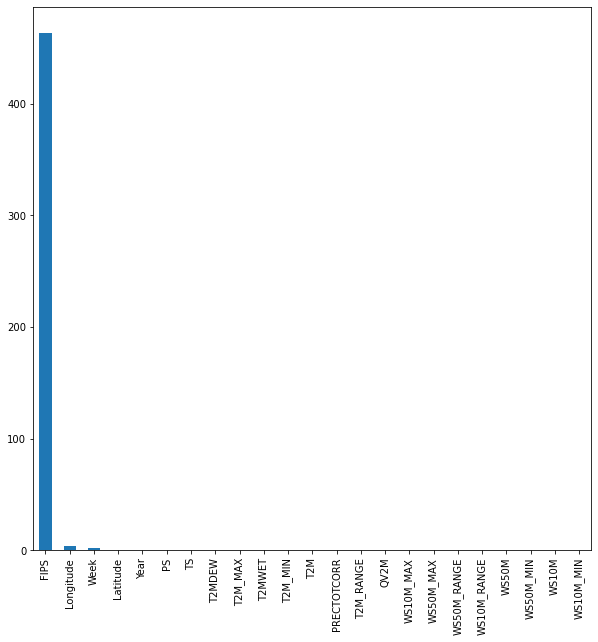

In [54]:
features.importance.sort_values(ascending=False).plot(kind='bar', figsize=(10,10))

In [55]:
import shap

In [56]:
# Explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(lgbm)

NameError: name 'lgbm' is not defined

In [ ]:
shap_values = explainer.shap_values(X)

In [ ]:
# Visualize the first prediction's explanation
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

If we take many explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset :

In [ ]:
shap.summary_plot(shap_values, X)